### Setup

In [ ]:
import tensorflow as tf

tf.random.set_seed(1)

import numpy as np

np.random.seed(1)

print(len(tf.config.list_physical_devices('GPU')))

0


In [ ]:
from tensorflow.keras.datasets import fashion_mnist

#Load the dataset
(x_train, y_train), (x_test,y_test) = fashion_mnist.load_data()

In [ ]:
# Merge training & testing sets since purpose of GAN is synthetic data generation here as opposed to classification
dataset = np.concatenate([x_train, x_test], axis=0)

# Normalize data between 0-1 for usage
dataset = np.expand_dims(dataset, -1).astype("float32") / 255.0

In [ ]:
BATCH_SIZE = 128

#conv layers work 3 channels
dataset = np.reshape(dataset, (-1,28,28,1))

#create a tf dataset object
dataset = tf.data.Dataset.from_tensor_slices(dataset)

#set batch_size to avoid reading one image at a time
dataset = dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

### Generator Model
  - Leaky ReLU works well here.

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

# The generator's input is usually a noise vector.
NOISE_DIM = 150

# In practice, GAN generators usually use leaky 'relu' and discriminators use regular 'relu'.
generator = keras.models.Sequential([
                                     keras.layers.InputLayer(input_shape=(NOISE_DIM,)),
                                     layers.Dense(7*7*256), #This num depends on number of total params in layer above see summary!!
                                     layers.Reshape(target_shape=(7,7,256)), # Based on layer above
                                     layers.Conv2DTranspose(256, 3, activation='LeakyReLU', strides=2, padding="same"),
                                     layers.Conv2DTranspose(128, kernel_size=3, activation='LeakyReLU', strides=2, padding="same"),
                                     layers.Conv2DTranspose(1,3, activation='sigmoid', padding="same"),
])

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1894144   
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 256)      590080    
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 28, 28, 128)      295040    
 ranspose)                                                       
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 28, 28, 1)        1153      
 ranspose)                                                       
                                                        

### Discriminator Model
- ReLU works best here.

In [ ]:
discriminator = keras.models.Sequential([
                                         keras.layers.InputLayer(input_shape=(28,28,1)),
                                         layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding="same", strides=2),
                                         layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding="same", strides=2),
                                         layers.Flatten(),
                                         layers.Dense(64, activation='relu'),
                                         layers.Dropout(0.2),
                                         layers.Dense(1, activation="sigmoid"),
])

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 256)       2560      
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 128)         295040    
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense_1 (Dense)             (None, 64)                401472    
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 699,137
Trainable params: 699,137
Non-tr

### Optimizers
 - We set different rates for generator and discriminator and try to maintain balance until nash-equilibria is attained.
 - If discriminator is very strong/ weak adversarial game fails

In [ ]:
optimizerG = keras.optimizers.Adam(learning_rate=0.00001, beta_1=0.5)
optimizerD = keras.optimizers.Adam(learning_rate=0.00003, beta_1 = 0.5)

### Classification
 - For a discriminator most commonly use loss function is binary cross entropy because the task is to distinguish between real and fake data.

In [ ]:
loss = keras.losses.BinaryCrossentropy(from_logits=True)

gAccMetric = keras.metrics.BinaryAccuracy()
dAccMetric = keras.metrics.BinaryAccuracy()

### Training for Discriminator and Generator

In [ ]:
## DISCRIMINATOR ##

@tf.function
def trainDStep(data):
  batchSize = tf.shape(data)[0] #data dim = 32,28,28,1 -->batch_size, img dims

  ## Create a noise vector as generator input sampled from Gaussian distribution at random ##
  noise = tf.random.normal(shape=(batchSize, NOISE_DIM))

  # Concatenate real and fake labels
  y_true = tf.concat([
                      #og data --> 1
                      tf.ones(batchSize, 1),
                      #synth data --> 0
                      tf.zeros(batchSize, 1)
  ],
  axis= 0
  )

  # Record the calculated gradients
  with tf.GradientTape() as tape:
    #generate forged samples
    fake = generator(noise)

    #concat real and forged data
    x =tf.concat([data, fake], axis=0)

    #Check is discriminator predicts them
    y_pred = discriminator(x)

    #Calculate Loss
    discriminatorLoss = loss(y_true, y_pred)

  # Apply backward prop and update weights
  grads = tape.gradient(discriminatorLoss, discriminator.trainable_weights)
  optimizerD.apply_gradients(zip(grads, discriminator.trainable_weights))

  # Report Accuracy
  dAccMetric.update_state(y_true, y_pred)

  #return loss for visualization
  return{
      "discriminator_loss": discriminatorLoss,
      "discriminator_accuracy": dAccMetric.result()
  }

In [ ]:
## GENERATOR ##

@tf.function
def trainGStep(data):
  batchSize = tf.shape(data)[0]
  
  noise = tf.random.normal(shape=(batchSize, NOISE_DIM))

  ## When training generator goal is to maximize probability that its output is 
   # classified as real ##
  y_true = tf.ones(batchSize, 1)

  # Record the calculated gradients
  with tf.GradientTape() as tape:
    y_pred = discriminator(generator(noise))
    generatorLoss = loss(y_true, y_pred)

  # Apply backward prop and update weights
  grads = tape.gradient(generatorLoss, generator.trainable_weights)
  optimizerG.apply_gradients(zip(grads, generator.trainable_weights))

  # Report Accuracy
  gAccMetric.update_state(y_true, y_pred)

  #return loss for visualization
  return{
      "generator_loss": generatorLoss,
      "generator_accuracy": gAccMetric.result()
  }

### Visualize Generated Images as Training goes on 

In [ ]:
from matplotlib import pyplot as plt

def plotImages(model):
  images = model(np.random.normal(size=(81, NOISE_DIM)))

  plt.figure(figsize=(9,9))

  for idx, img in enumerate(images):
    plt.subplot(9,9,idx+1)
    plt.imshow(np.squeeze(img,-1), cmap="Greys_r")
    plt.axis("off")

  plt.show()

### Using the Model
 - Model.fit is no longer a viable way to run the model so we use a for loop to run the model instead.

E:0, Loss G:0.6602, Loss D:0.5393, Acc G:%0.10, Acc D:%86.69


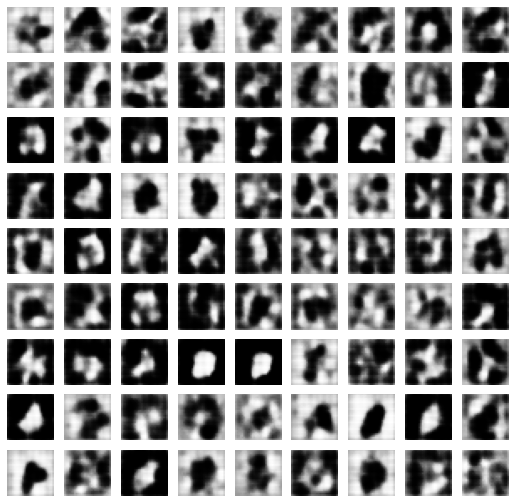

E:1, Loss G:0.6635, Loss D:0.5407, Acc G:%1.05, Acc D:%95.51
E:2, Loss G:0.6779, Loss D:0.5226, Acc G:%0.96, Acc D:%96.08


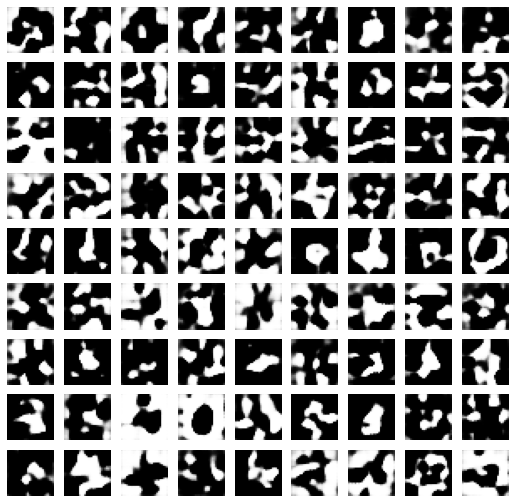

E:3, Loss G:0.6833, Loss D:0.5162, Acc G:%0.80, Acc D:%96.84
E:4, Loss G:0.6853, Loss D:0.5142, Acc G:%0.73, Acc D:%97.25


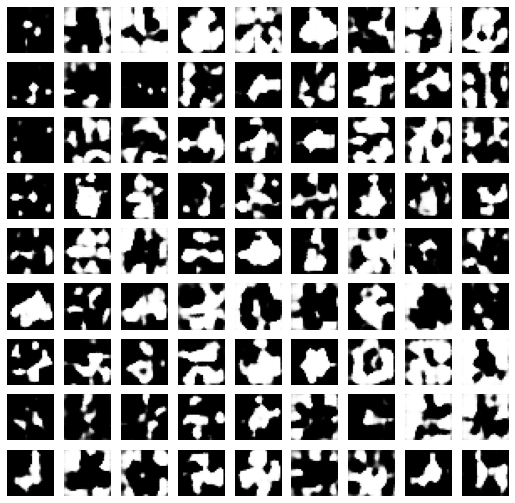

E:5, Loss G:0.6877, Loss D:0.5111, Acc G:%0.65, Acc D:%97.56
E:6, Loss G:0.6886, Loss D:0.5101, Acc G:%0.58, Acc D:%97.81


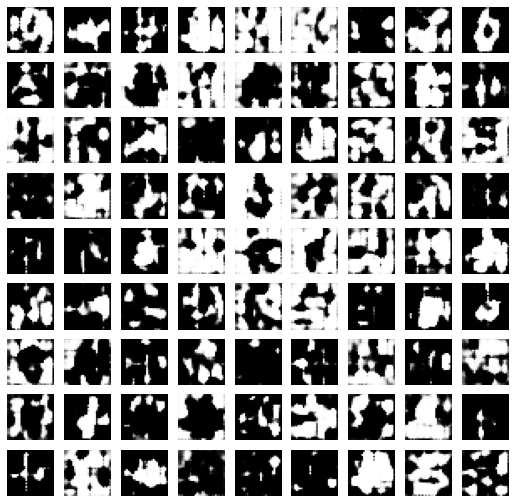

E:7, Loss G:0.6869, Loss D:0.5139, Acc G:%0.54, Acc D:%97.93
E:8, Loss G:0.6921, Loss D:0.5049, Acc G:%0.50, Acc D:%98.06


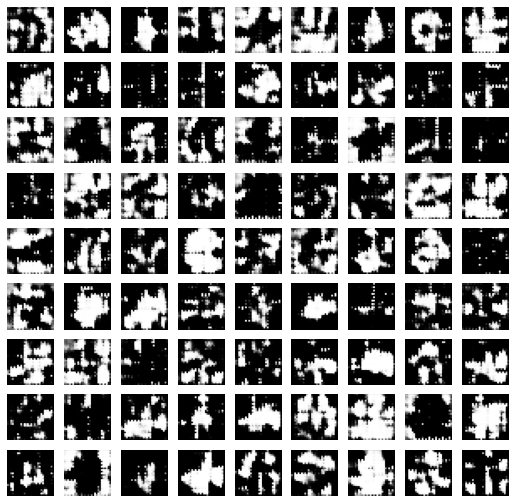

E:9, Loss G:0.6896, Loss D:0.5089, Acc G:%0.46, Acc D:%98.23
E:10, Loss G:0.6871, Loss D:0.5137, Acc G:%0.49, Acc D:%98.22


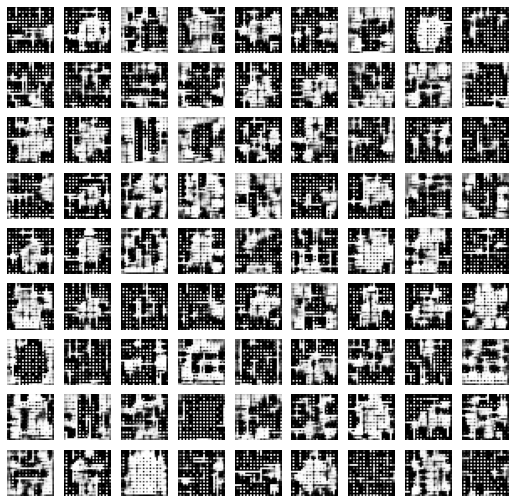

E:11, Loss G:0.6922, Loss D:0.5049, Acc G:%0.48, Acc D:%98.31
E:12, Loss G:0.6754, Loss D:0.5379, Acc G:%0.50, Acc D:%98.28


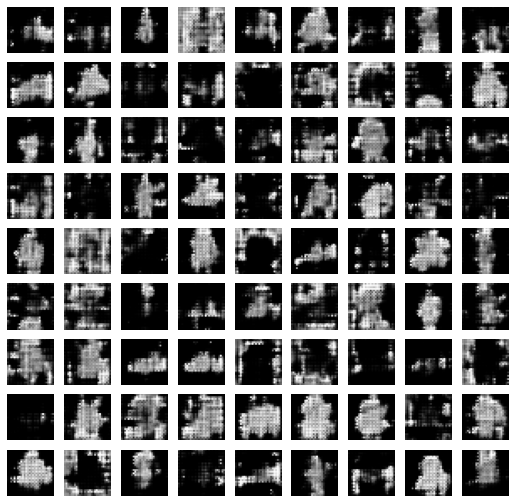

E:13, Loss G:0.6460, Loss D:0.6112, Acc G:%0.86, Acc D:%97.17
E:14, Loss G:0.6321, Loss D:0.6368, Acc G:%1.62, Acc D:%95.32


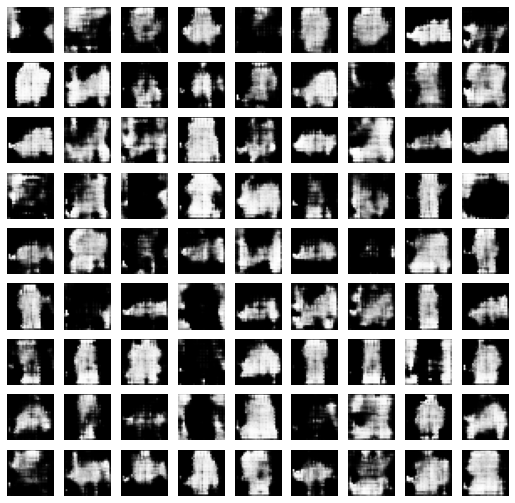

E:15, Loss G:0.6397, Loss D:0.6189, Acc G:%2.22, Acc D:%93.77
E:16, Loss G:0.6371, Loss D:0.6202, Acc G:%2.63, Acc D:%92.59


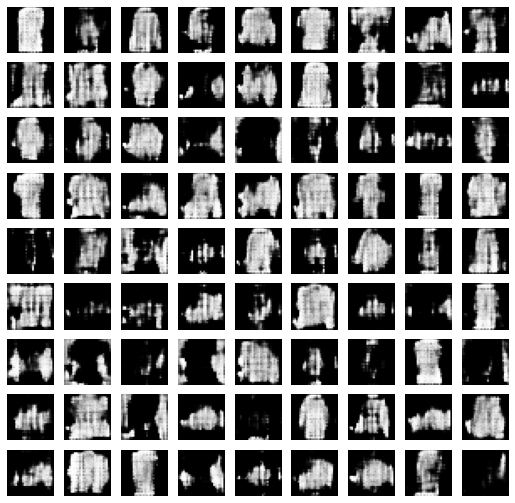

E:17, Loss G:0.6418, Loss D:0.6159, Acc G:%2.92, Acc D:%91.53
E:18, Loss G:0.6384, Loss D:0.6160, Acc G:%3.13, Acc D:%90.63


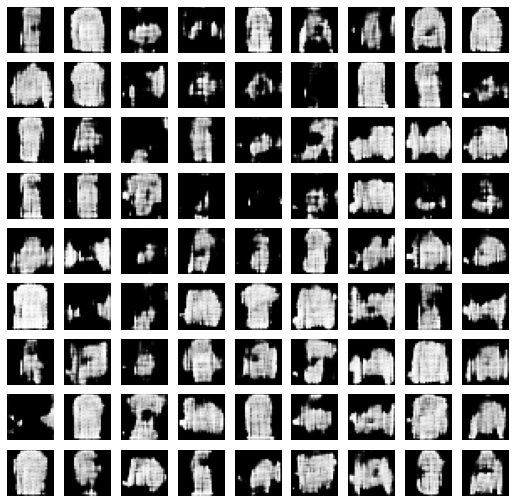

E:19, Loss G:0.6382, Loss D:0.6192, Acc G:%3.30, Acc D:%89.83
E:20, Loss G:0.6416, Loss D:0.6220, Acc G:%3.40, Acc D:%89.02


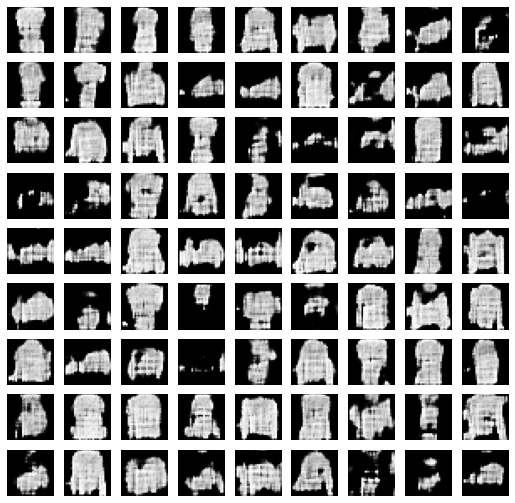

E:21, Loss G:0.6417, Loss D:0.6188, Acc G:%3.50, Acc D:%88.29
E:22, Loss G:0.6402, Loss D:0.6175, Acc G:%3.59, Acc D:%87.65


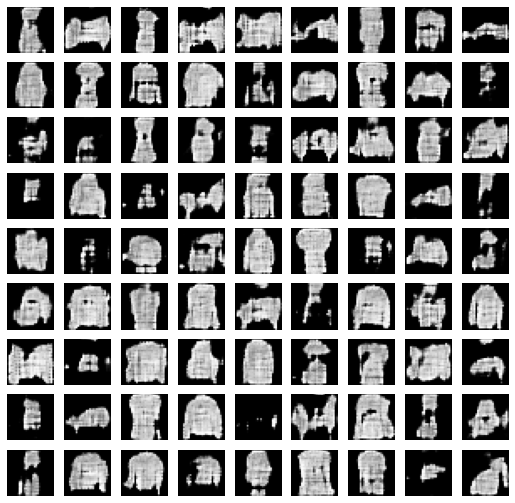

E:23, Loss G:0.6380, Loss D:0.6163, Acc G:%3.69, Acc D:%87.09
E:24, Loss G:0.6368, Loss D:0.6156, Acc G:%3.78, Acc D:%86.60


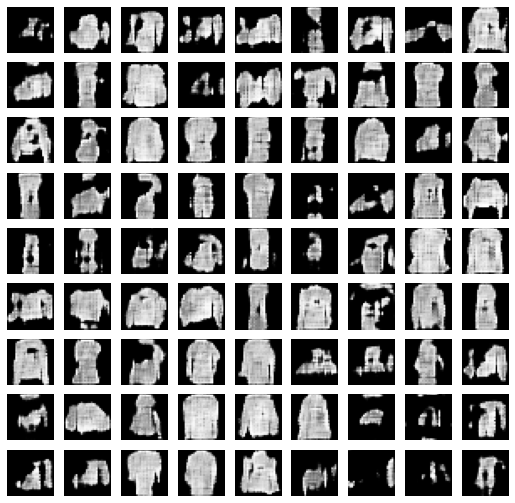

E:25, Loss G:0.6380, Loss D:0.6163, Acc G:%3.87, Acc D:%86.15
E:26, Loss G:0.6383, Loss D:0.6170, Acc G:%3.93, Acc D:%85.73


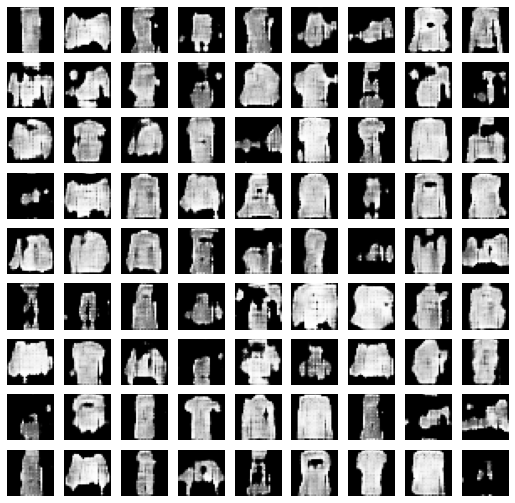

E:27, Loss G:0.6376, Loss D:0.6184, Acc G:%3.99, Acc D:%85.32
E:28, Loss G:0.6382, Loss D:0.6182, Acc G:%4.06, Acc D:%84.92


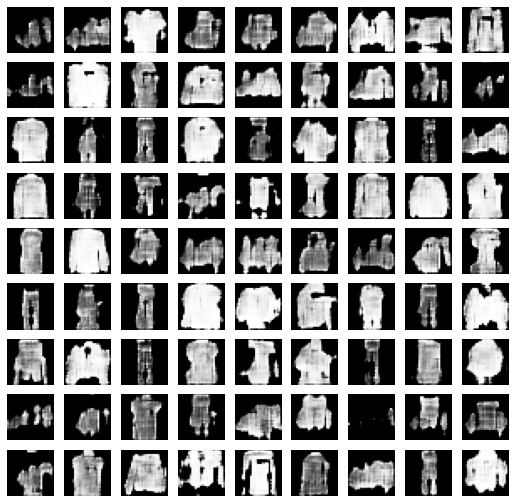

E:29, Loss G:0.6378, Loss D:0.6156, Acc G:%4.14, Acc D:%84.56
E:30, Loss G:0.6387, Loss D:0.6145, Acc G:%4.21, Acc D:%84.24


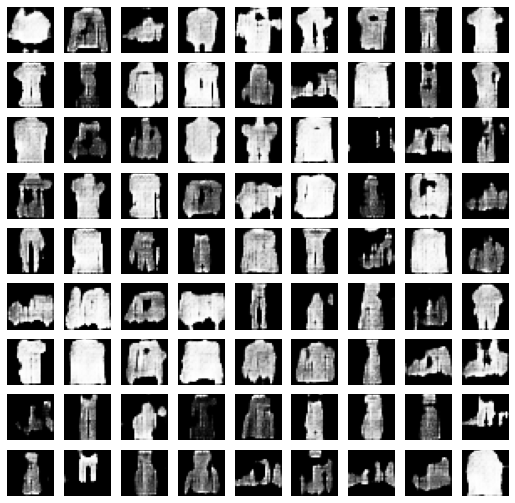

E:31, Loss G:0.6397, Loss D:0.6135, Acc G:%4.27, Acc D:%83.95
E:32, Loss G:0.6408, Loss D:0.6124, Acc G:%4.32, Acc D:%83.67


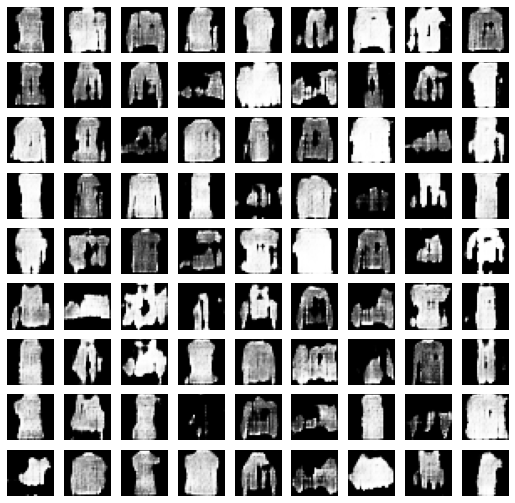

E:33, Loss G:0.6402, Loss D:0.6118, Acc G:%4.37, Acc D:%83.42
E:34, Loss G:0.6416, Loss D:0.6103, Acc G:%4.41, Acc D:%83.18


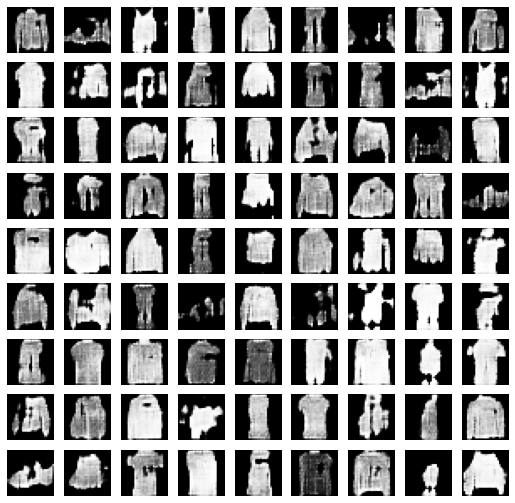

E:35, Loss G:0.6429, Loss D:0.6103, Acc G:%4.44, Acc D:%82.97
E:36, Loss G:0.6440, Loss D:0.6091, Acc G:%4.46, Acc D:%82.76


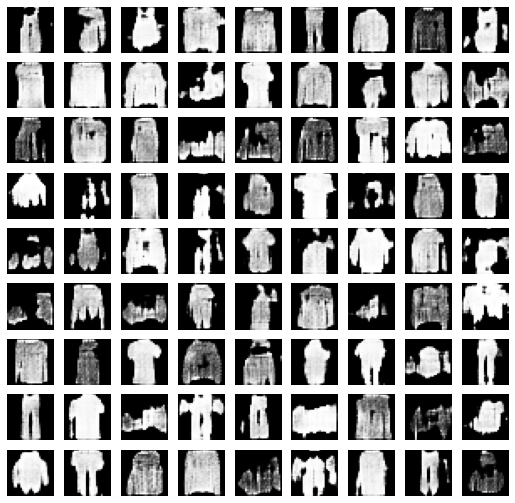

E:37, Loss G:0.6439, Loss D:0.6088, Acc G:%4.47, Acc D:%82.57
E:38, Loss G:0.6457, Loss D:0.6093, Acc G:%4.47, Acc D:%82.39


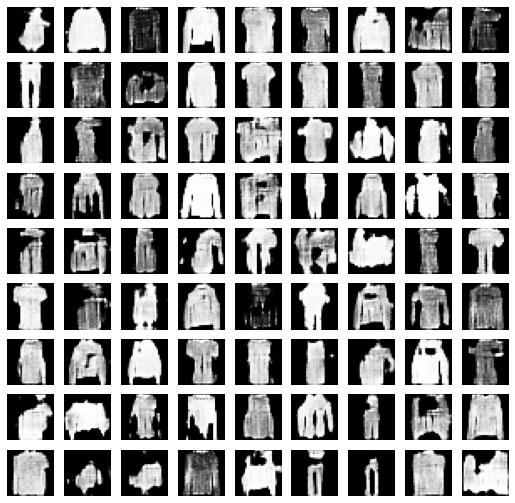

E:39, Loss G:0.6462, Loss D:0.6084, Acc G:%4.47, Acc D:%82.21
E:40, Loss G:0.6472, Loss D:0.6089, Acc G:%4.46, Acc D:%82.04


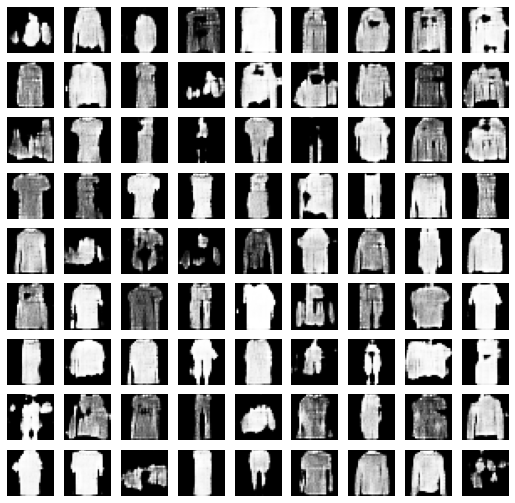

E:41, Loss G:0.6481, Loss D:0.6094, Acc G:%4.44, Acc D:%81.87
E:42, Loss G:0.6490, Loss D:0.6101, Acc G:%4.43, Acc D:%81.70


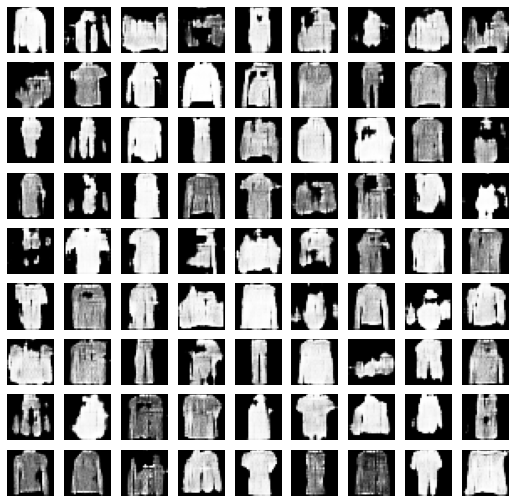

E:43, Loss G:0.6502, Loss D:0.6124, Acc G:%4.42, Acc D:%81.53
E:44, Loss G:0.6502, Loss D:0.6115, Acc G:%4.41, Acc D:%81.36


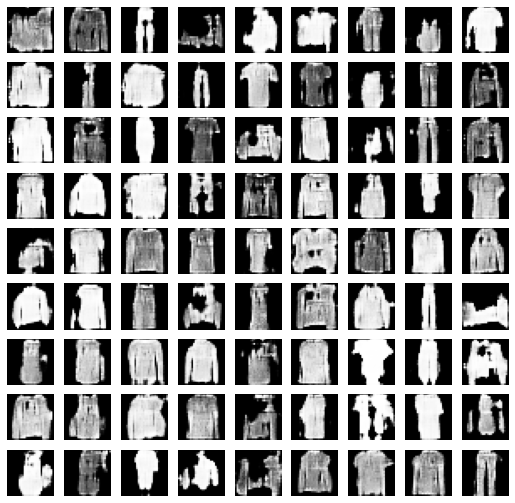

E:45, Loss G:0.6516, Loss D:0.6136, Acc G:%4.39, Acc D:%81.18
E:46, Loss G:0.6511, Loss D:0.6132, Acc G:%4.38, Acc D:%81.01


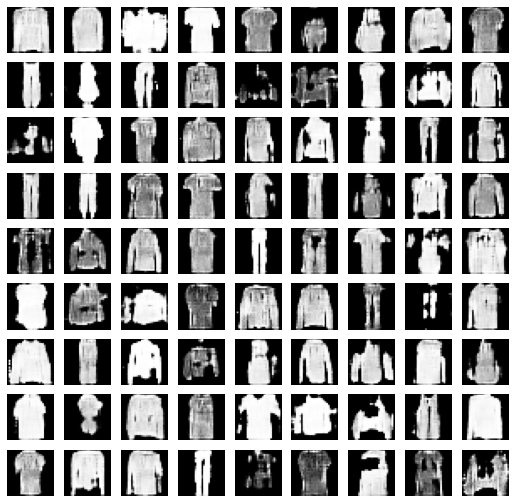

E:47, Loss G:0.6524, Loss D:0.6137, Acc G:%4.36, Acc D:%80.85
E:48, Loss G:0.6541, Loss D:0.6135, Acc G:%4.34, Acc D:%80.69


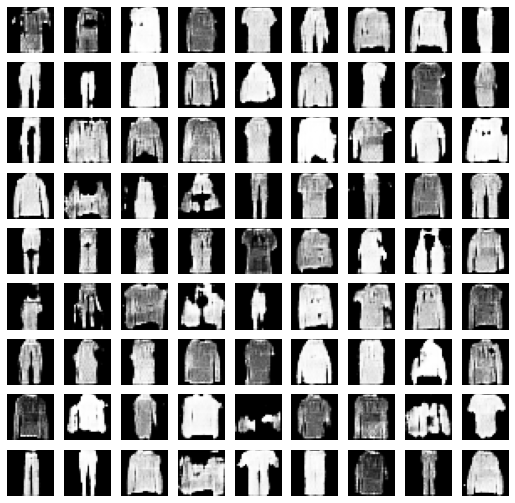

E:49, Loss G:0.6544, Loss D:0.6130, Acc G:%4.32, Acc D:%80.54
E:50, Loss G:0.6545, Loss D:0.6127, Acc G:%4.29, Acc D:%80.39


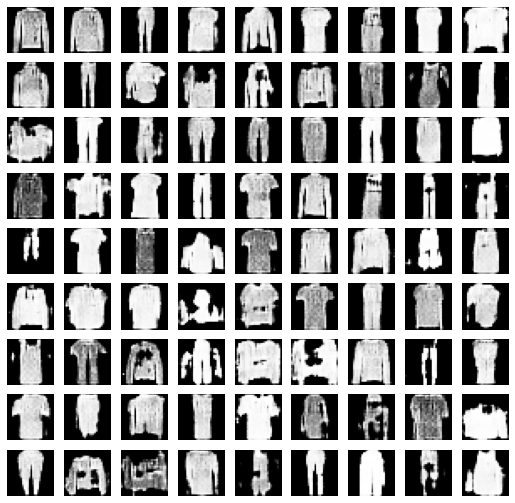

E:51, Loss G:0.6545, Loss D:0.6122, Acc G:%4.27, Acc D:%80.25
E:52, Loss G:0.6550, Loss D:0.6124, Acc G:%4.24, Acc D:%80.12


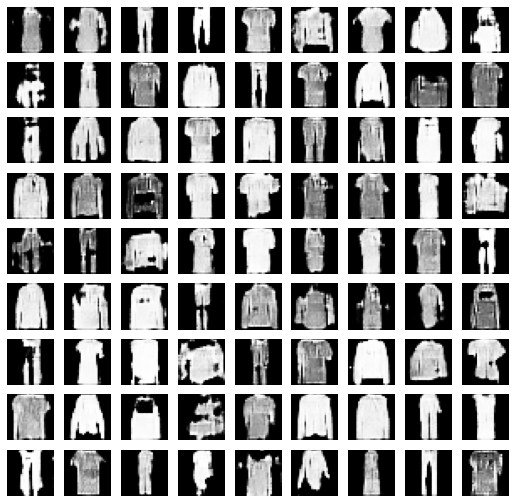

E:53, Loss G:0.6592, Loss D:0.6149, Acc G:%4.21, Acc D:%79.98
E:54, Loss G:0.6570, Loss D:0.6133, Acc G:%4.18, Acc D:%79.84


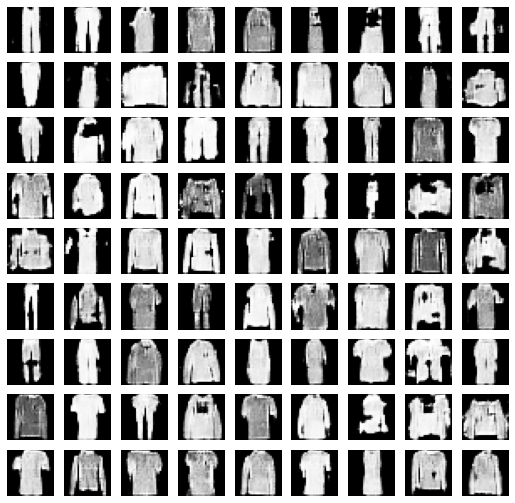

E:55, Loss G:0.6575, Loss D:0.6134, Acc G:%4.15, Acc D:%79.72
E:56, Loss G:0.6576, Loss D:0.6138, Acc G:%4.12, Acc D:%79.59


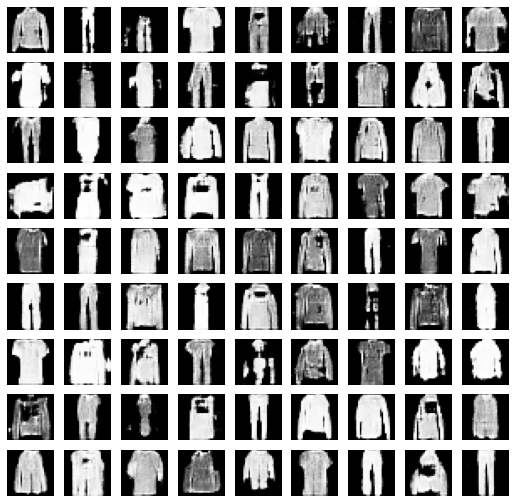

E:57, Loss G:0.6588, Loss D:0.6141, Acc G:%4.09, Acc D:%79.47
E:58, Loss G:0.6597, Loss D:0.6153, Acc G:%4.06, Acc D:%79.34


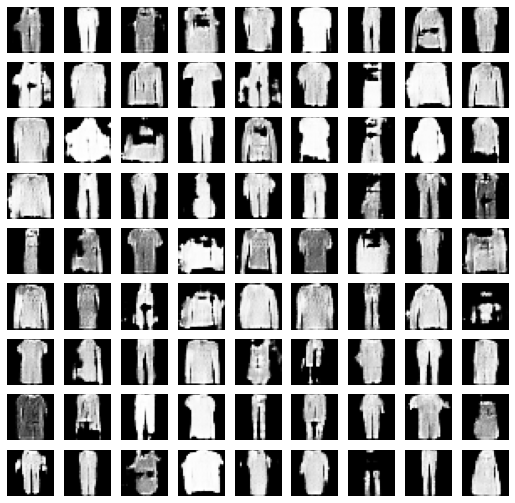

E:59, Loss G:0.6604, Loss D:0.6158, Acc G:%4.03, Acc D:%79.22
E:60, Loss G:0.6614, Loss D:0.6171, Acc G:%4.00, Acc D:%79.09


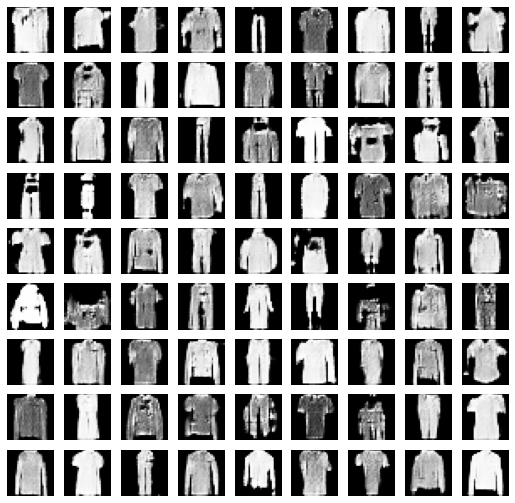

E:61, Loss G:0.6636, Loss D:0.6186, Acc G:%3.97, Acc D:%78.96
E:62, Loss G:0.6624, Loss D:0.6176, Acc G:%3.94, Acc D:%78.83


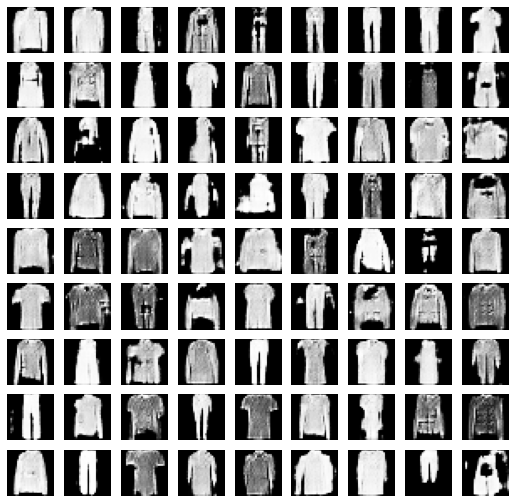

E:63, Loss G:0.6641, Loss D:0.6191, Acc G:%3.91, Acc D:%78.71
E:64, Loss G:0.6655, Loss D:0.6197, Acc G:%3.88, Acc D:%78.58


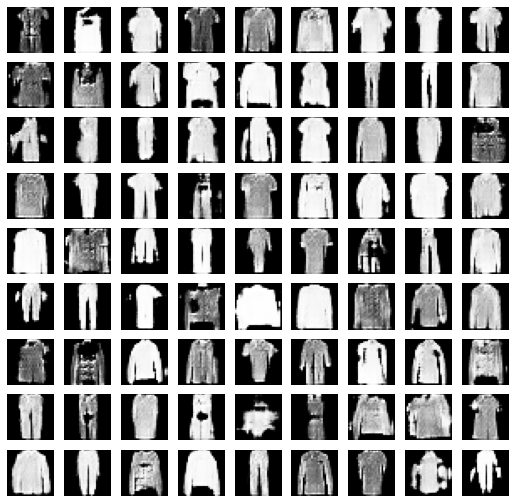

E:65, Loss G:0.6641, Loss D:0.6191, Acc G:%3.85, Acc D:%78.46
E:66, Loss G:0.6649, Loss D:0.6199, Acc G:%3.82, Acc D:%78.34


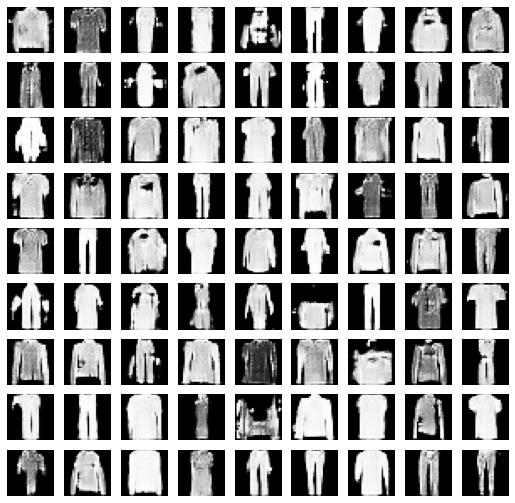

E:67, Loss G:0.6643, Loss D:0.6195, Acc G:%3.80, Acc D:%78.22
E:68, Loss G:0.6647, Loss D:0.6199, Acc G:%3.77, Acc D:%78.10


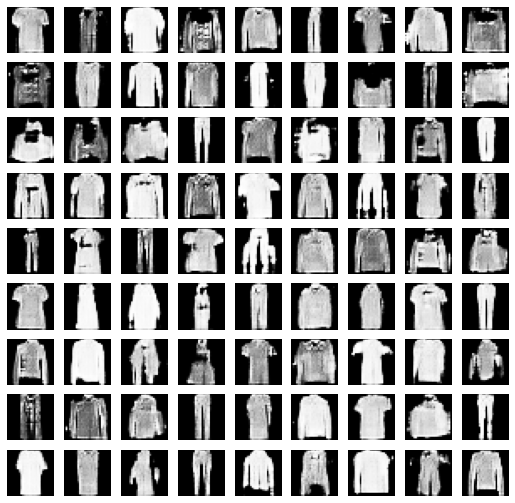

E:69, Loss G:0.6655, Loss D:0.6202, Acc G:%3.74, Acc D:%77.99
E:70, Loss G:0.6633, Loss D:0.6185, Acc G:%3.72, Acc D:%77.89


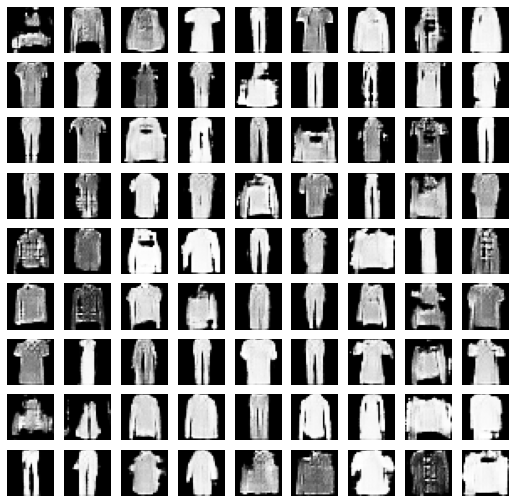

E:71, Loss G:0.6670, Loss D:0.6206, Acc G:%3.69, Acc D:%77.78
E:72, Loss G:0.6651, Loss D:0.6196, Acc G:%3.67, Acc D:%77.68


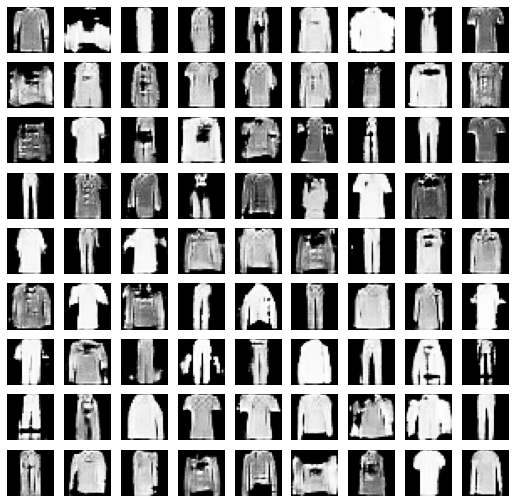

E:73, Loss G:0.6627, Loss D:0.6184, Acc G:%3.64, Acc D:%77.58
E:74, Loss G:0.6664, Loss D:0.6199, Acc G:%3.62, Acc D:%77.49


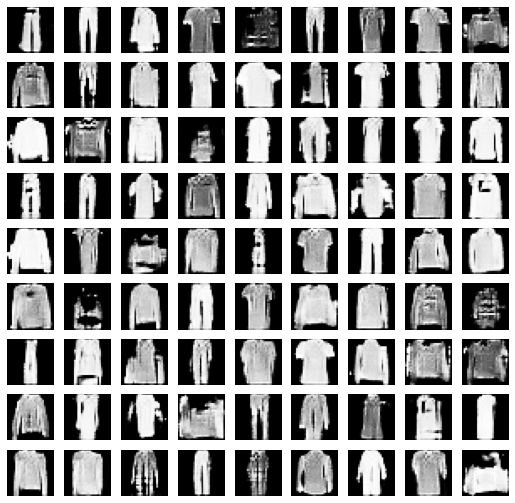

E:75, Loss G:0.6675, Loss D:0.6210, Acc G:%3.60, Acc D:%77.39
E:76, Loss G:0.6645, Loss D:0.6197, Acc G:%3.57, Acc D:%77.30


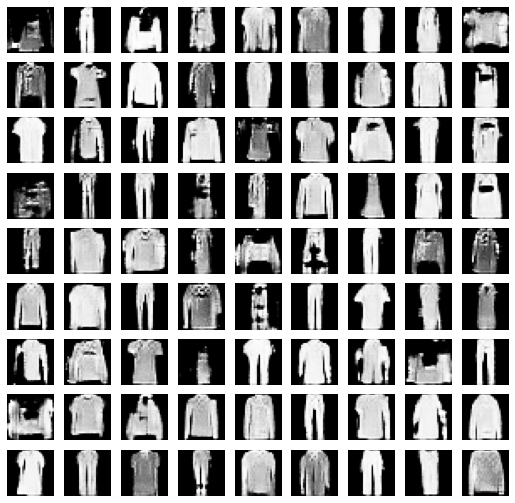

E:77, Loss G:0.6651, Loss D:0.6202, Acc G:%3.55, Acc D:%77.21
E:78, Loss G:0.6645, Loss D:0.6204, Acc G:%3.53, Acc D:%77.12


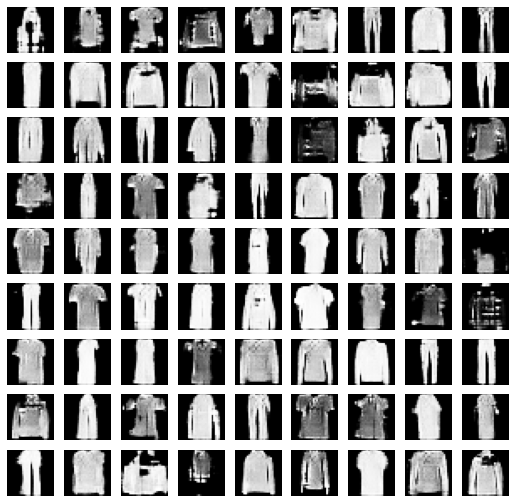

E:79, Loss G:0.6630, Loss D:0.6195, Acc G:%3.51, Acc D:%77.03
E:80, Loss G:0.6603, Loss D:0.6174, Acc G:%3.50, Acc D:%76.96


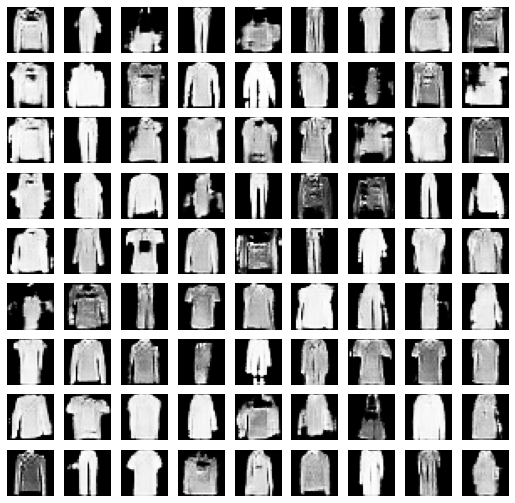

E:81, Loss G:0.6628, Loss D:0.6191, Acc G:%3.48, Acc D:%76.88
E:82, Loss G:0.6614, Loss D:0.6181, Acc G:%3.47, Acc D:%76.81


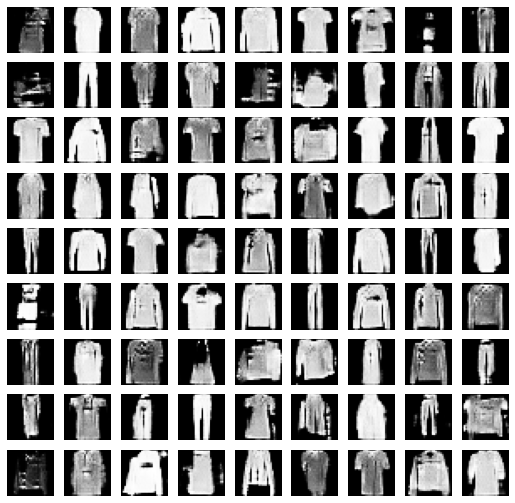

E:83, Loss G:0.6615, Loss D:0.6184, Acc G:%3.45, Acc D:%76.74
E:84, Loss G:0.6605, Loss D:0.6176, Acc G:%3.44, Acc D:%76.68


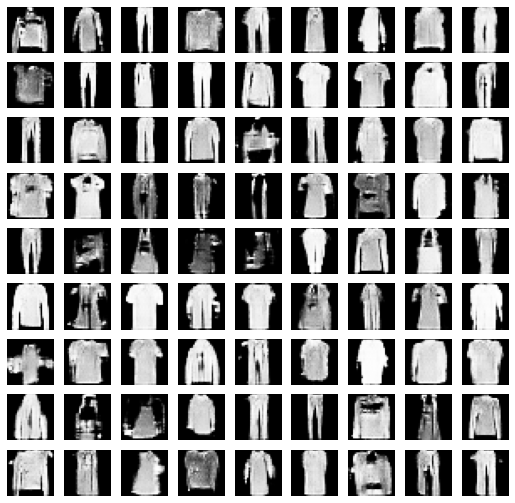

E:85, Loss G:0.6594, Loss D:0.6166, Acc G:%3.43, Acc D:%76.61
E:86, Loss G:0.6578, Loss D:0.6150, Acc G:%3.41, Acc D:%76.56


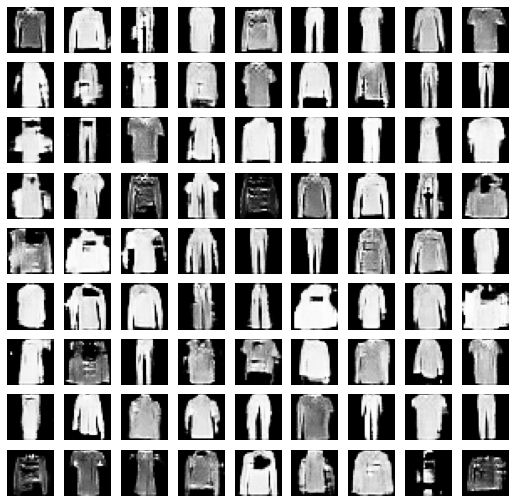

E:87, Loss G:0.6606, Loss D:0.6170, Acc G:%3.40, Acc D:%76.50
E:88, Loss G:0.6588, Loss D:0.6153, Acc G:%3.39, Acc D:%76.45


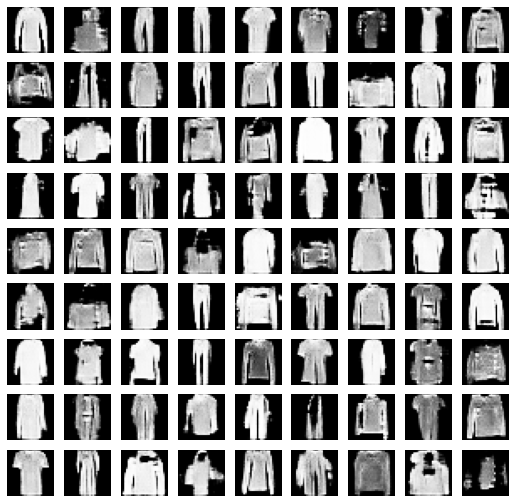

E:89, Loss G:0.6594, Loss D:0.6157, Acc G:%3.37, Acc D:%76.39
E:90, Loss G:0.6605, Loss D:0.6158, Acc G:%3.36, Acc D:%76.34


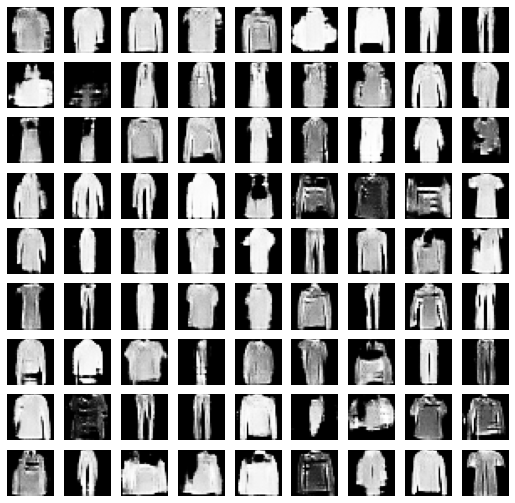

E:91, Loss G:0.6609, Loss D:0.6160, Acc G:%3.34, Acc D:%76.29
E:92, Loss G:0.6596, Loss D:0.6152, Acc G:%3.33, Acc D:%76.24


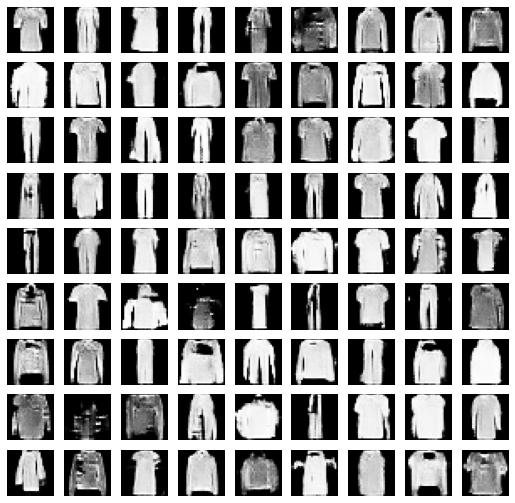

E:93, Loss G:0.6609, Loss D:0.6159, Acc G:%3.32, Acc D:%76.20
E:94, Loss G:0.6605, Loss D:0.6156, Acc G:%3.30, Acc D:%76.15


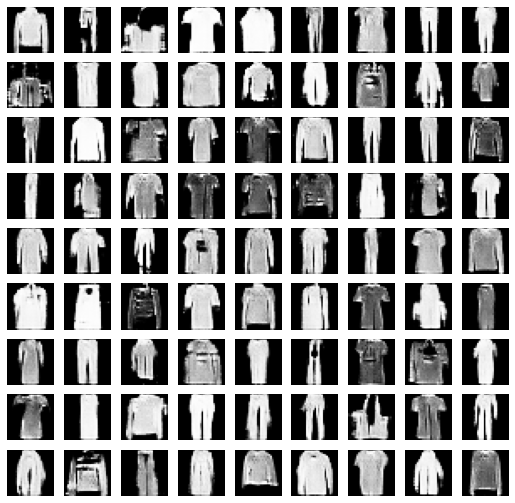

E:95, Loss G:0.6590, Loss D:0.6137, Acc G:%3.29, Acc D:%76.11
E:96, Loss G:0.6603, Loss D:0.6145, Acc G:%3.28, Acc D:%76.07


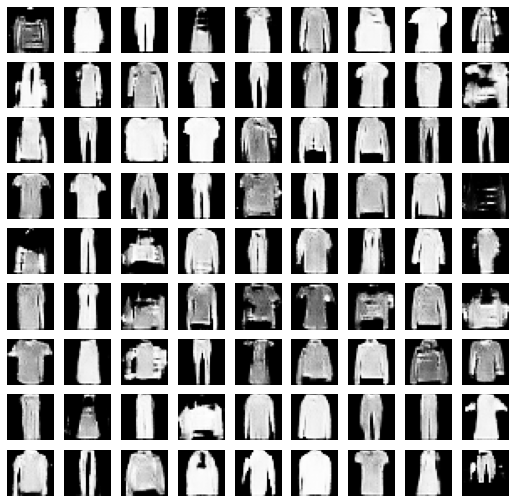

E:97, Loss G:0.6611, Loss D:0.6149, Acc G:%3.27, Acc D:%76.03
E:98, Loss G:0.6597, Loss D:0.6138, Acc G:%3.25, Acc D:%75.99


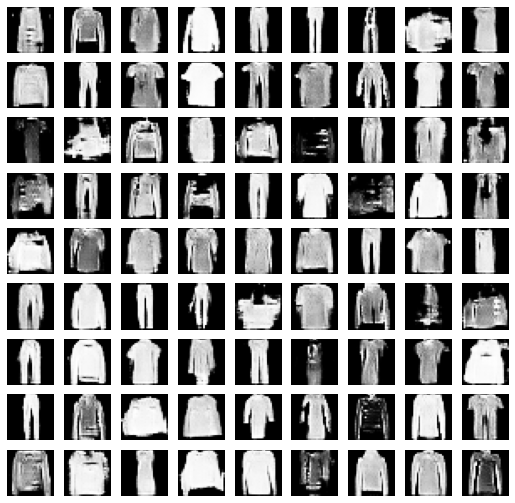

E:99, Loss G:0.6582, Loss D:0.6126, Acc G:%3.24, Acc D:%75.95


In [ ]:
for epoch in range(100):

  # Accumulate loss to calculate average at end of each epoch
  dLossSum = 0
  gLossSum = 0
  dAccSum = 0
  gAccSum = 0
  cnt = 0

  # Loop dataset one batch at a time
  for batch in dataset:
    # train discriminator, the 2 lines below can be repeated multiple times 
    # before training generator and calculating discriminator accuracy
    dLoss = trainDStep(batch)
    dLossSum += dLoss['discriminator_loss']
    dAccSum += dLoss['discriminator_accuracy']

    #train generator
    gLoss = trainGStep(batch)
    gLossSum += gLoss['generator_loss']
    gAccSum += gLoss['generator_accuracy']

    #increment counter
    cnt+=1

  # Log the performance of our GAN
  print("E:{}, Loss G:{:0.4f}, Loss D:{:0.4f}, Acc G:%{:0.2f}, Acc D:%{:0.2f}".format(
      epoch,
      gLossSum/cnt,
      dLossSum/cnt,
      100 * gAccSum/cnt,
      100 * dAccSum/cnt,
  ))

  if epoch %2 ==0:
    plotImages(generator)

### Generate Some Samples

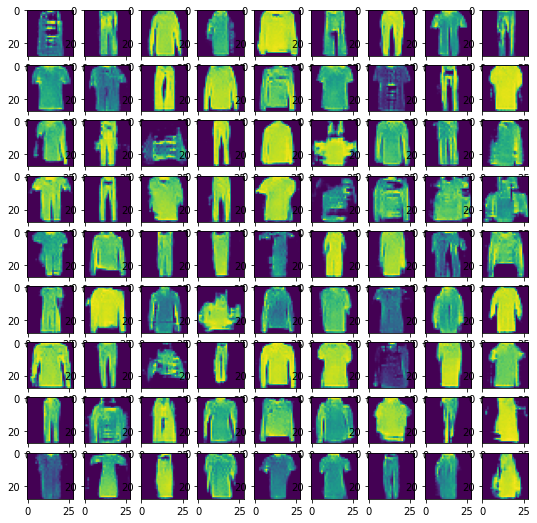

In [ ]:
images = generator(np.random.normal(size=(81, NOISE_DIM)))

#plot the images
plt.figure(figsize=(9,9))

for idx, img in enumerate(images):
  plt.subplot(9,9,idx+1)
  plt.imshow(np.squeeze(img, -1))
  
plt.show()